# HR Analytics Project- Understanding the Attrition in HR

# Project Description

Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

# Importing libraries

In [115]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings
warnings.filterwarnings ('ignore')

# Importing Dataset

In [116]:
df=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [117]:
df.shape

(1470, 35)

Dataset has 1470 rows and 35 columns 

In [118]:
df.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


Top 5 rows of the dataset

In [119]:
df.tail(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


Last 5 rows of the dataset

# Exploratory Data Analysis [EDA]

In [120]:
df.columns.to_list()

['Age',
 'Attrition',
 'BusinessTravel',
 'DailyRate',
 'Department',
 'DistanceFromHome',
 'Education',
 'EducationField',
 'EmployeeCount',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'Gender',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobRole',
 'JobSatisfaction',
 'MaritalStatus',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'Over18',
 'OverTime',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StandardHours',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

It is showing a list of all the columns names present in the dataset

In [121]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

the dataset contains two types of data ['int64', 'object']

In [122]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

Here we can see the general information about the dataset like prescence of null values, data type present in the dataset, memory usage of the dataset.

# Checking for duplicate values

In [123]:
df.duplicated().sum()

0

There are no duplicate value presents in the dataset

# Checking For The Null Values

In [124]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

<AxesSubplot:>

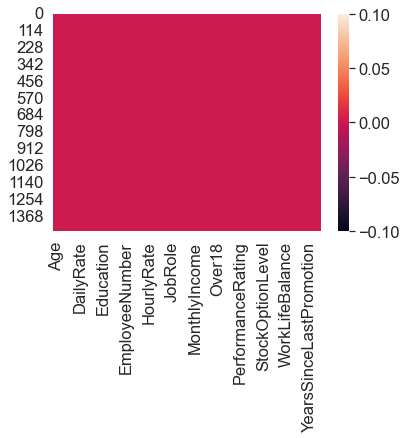

In [125]:
#By using heatmap
sns.heatmap(df.isnull())

As we can see here that no null values are present in the dataset

In [126]:
df.Attrition.nunique()

2

In [127]:
df.Attrition.unique()

array(['Yes', 'No'], dtype=object)

In [128]:
df.value_counts('Attrition')

Attrition
No     1233
Yes     237
dtype: int64

Here we can say that our target variable has only two values ['yes', 'No'] so it is a binary classification problem 

# Seprating Numerical and categorical column

In [129]:
#checking for categorical columns

categorical_col = [col for col in df.columns if df.dtypes[col] == 'object']
print('categorical columns:', categorical_col)

categorical columns: ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime']


In [130]:
#checking numerical columns

numerical_col = [col for col in df.columns if df.dtypes[col] != 'object']
print('numerical columns:', numerical_col)

numerical columns: ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount', 'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


Here we can see the list of all the Categorical columns and numerical columns

# Description of dataset

In [131]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


Observation=

1. The count for all the rows is same so no null value present in the dataset.


2. We can observe mean, std, min., 25%,50%,75% th percentile, max. values of the data.


3. There is a huge difference between 75th percentile value and max. value so outliers are present in the dataset.


4. By looking at mean value and 50th percentile value we can say that Skewness is also present in the dataset. 

# Data Visualization

# Univarient Analysis

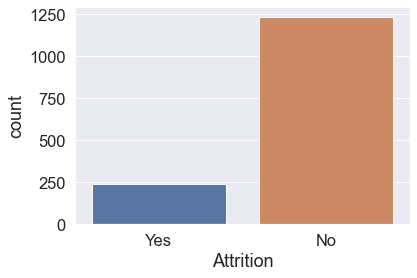

<Figure size 1080x1440 with 0 Axes>

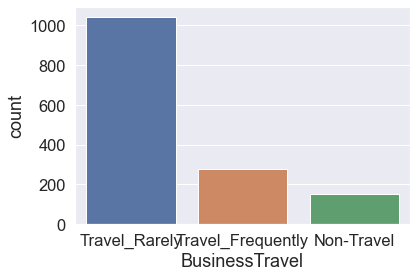

<Figure size 1080x1440 with 0 Axes>

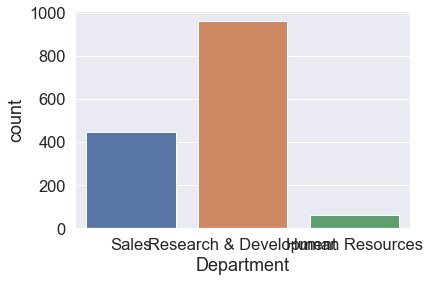

<Figure size 1080x1440 with 0 Axes>

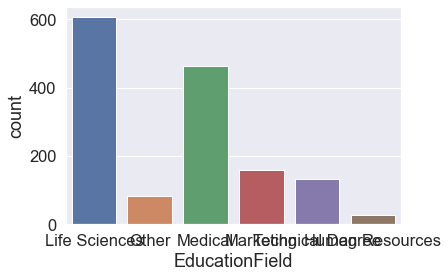

<Figure size 1080x1440 with 0 Axes>

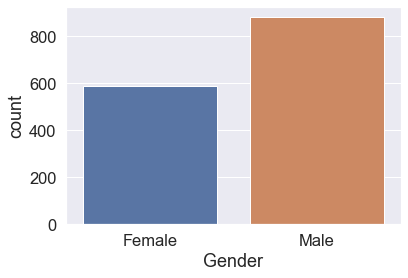

<Figure size 1080x1440 with 0 Axes>

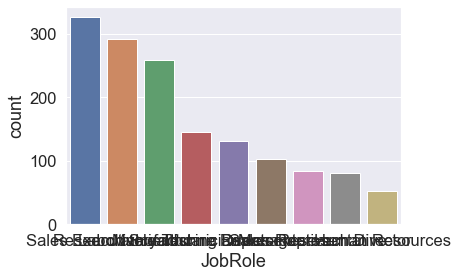

<Figure size 1080x1440 with 0 Axes>

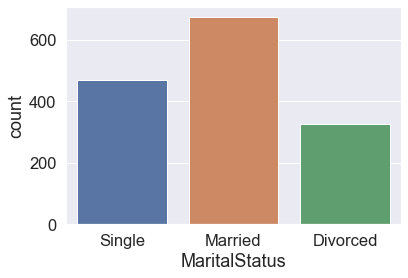

<Figure size 1080x1440 with 0 Axes>

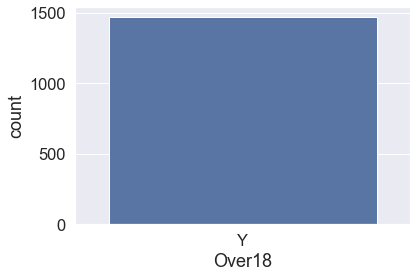

<Figure size 1080x1440 with 0 Axes>

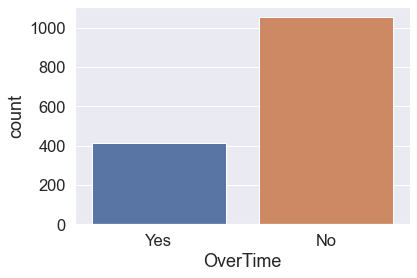

<Figure size 1080x1440 with 0 Axes>

In [132]:
for i in categorical_col:
    sns.countplot(x=i,data=df)
    plt.figure(figsize=(15,20))
    plt.show()

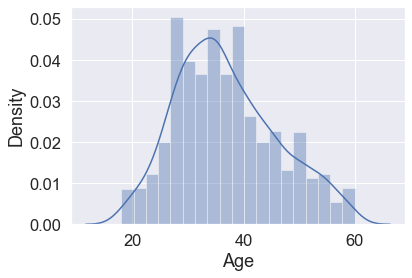

<Figure size 1080x1440 with 0 Axes>

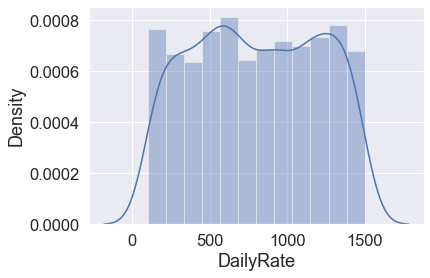

<Figure size 1080x1440 with 0 Axes>

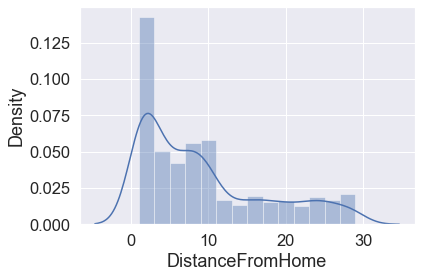

<Figure size 1080x1440 with 0 Axes>

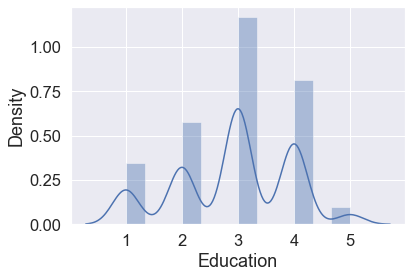

<Figure size 1080x1440 with 0 Axes>

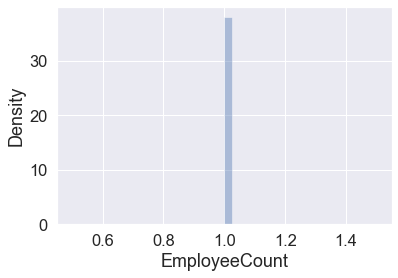

<Figure size 1080x1440 with 0 Axes>

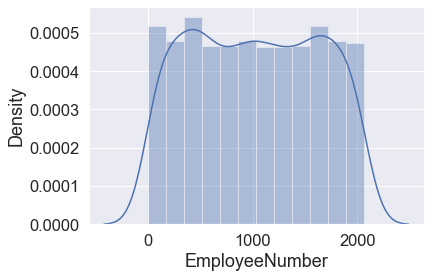

<Figure size 1080x1440 with 0 Axes>

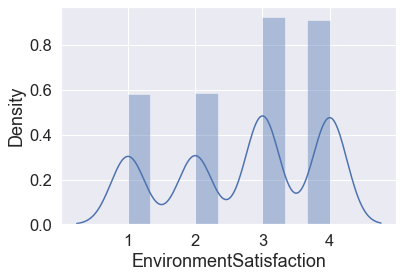

<Figure size 1080x1440 with 0 Axes>

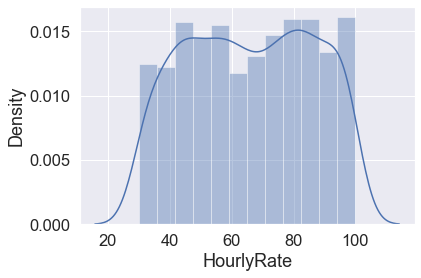

<Figure size 1080x1440 with 0 Axes>

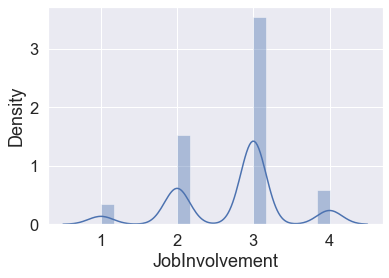

<Figure size 1080x1440 with 0 Axes>

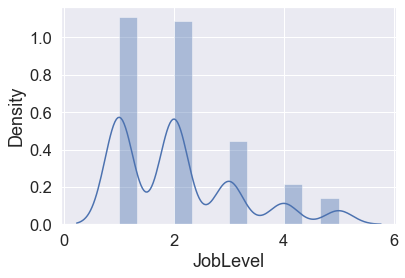

<Figure size 1080x1440 with 0 Axes>

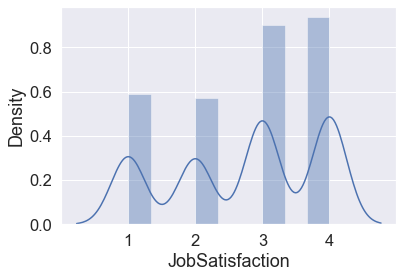

<Figure size 1080x1440 with 0 Axes>

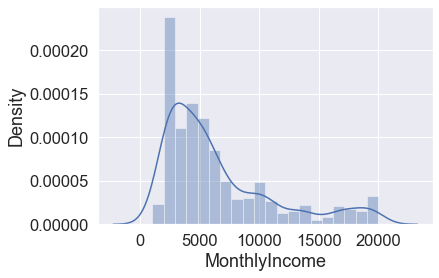

<Figure size 1080x1440 with 0 Axes>

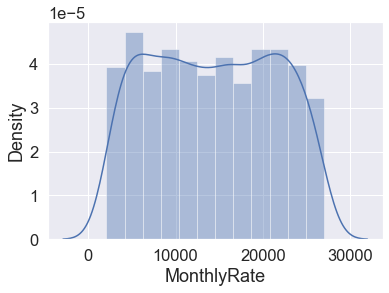

<Figure size 1080x1440 with 0 Axes>

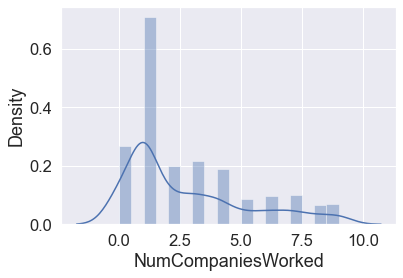

<Figure size 1080x1440 with 0 Axes>

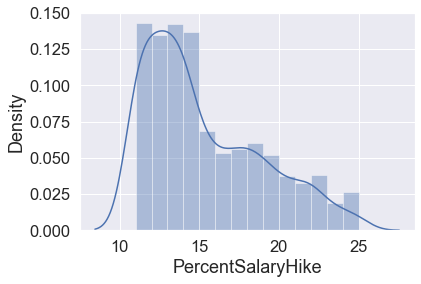

<Figure size 1080x1440 with 0 Axes>

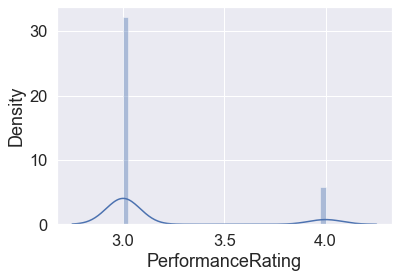

<Figure size 1080x1440 with 0 Axes>

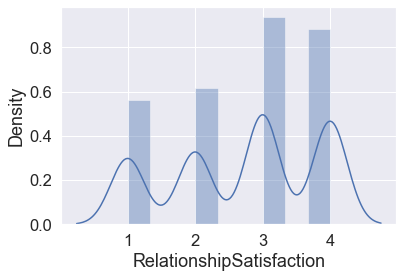

<Figure size 1080x1440 with 0 Axes>

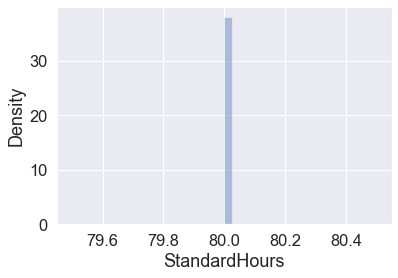

<Figure size 1080x1440 with 0 Axes>

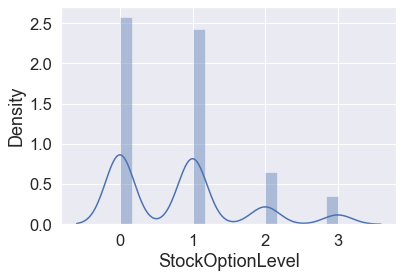

<Figure size 1080x1440 with 0 Axes>

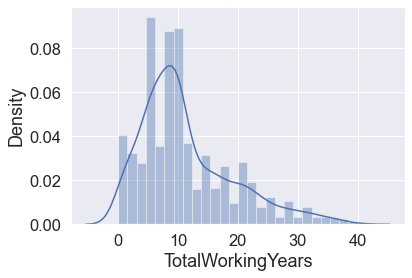

<Figure size 1080x1440 with 0 Axes>

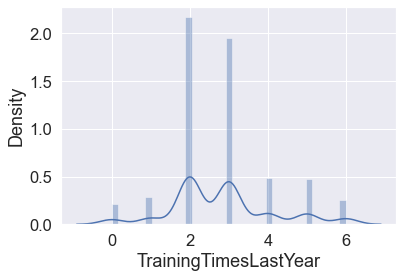

<Figure size 1080x1440 with 0 Axes>

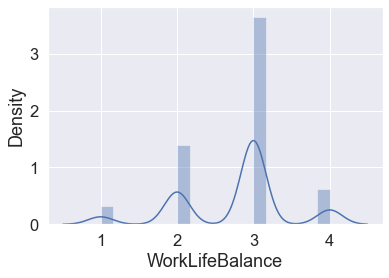

<Figure size 1080x1440 with 0 Axes>

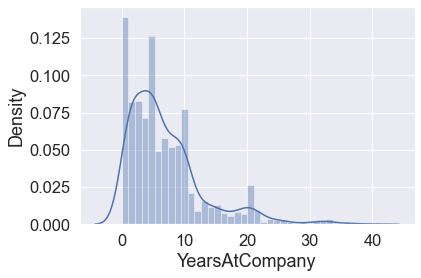

<Figure size 1080x1440 with 0 Axes>

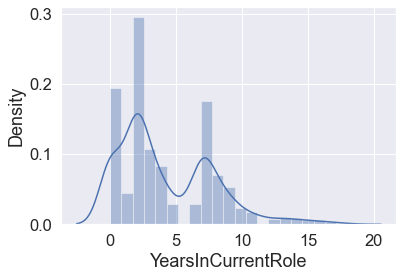

<Figure size 1080x1440 with 0 Axes>

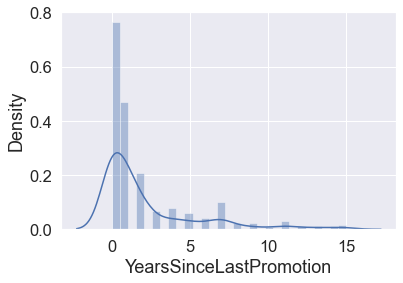

<Figure size 1080x1440 with 0 Axes>

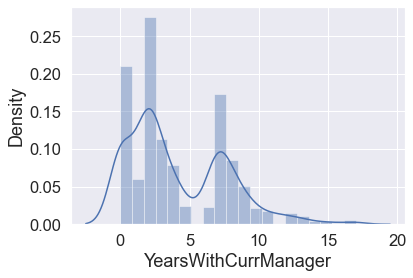

<Figure size 1080x1440 with 0 Axes>

In [133]:
for i in numerical_col:
    sns.distplot(df[i])
    plt.figure(figsize=(15,20))
    plt.show()

# Bivarient Analysis 

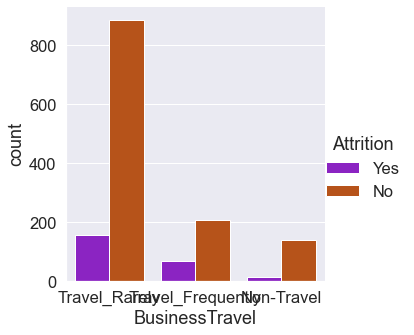

In [134]:
sns.catplot(x='BusinessTravel', hue='Attrition', palette='gnuplot', kind='count', data=df)
plt.show()

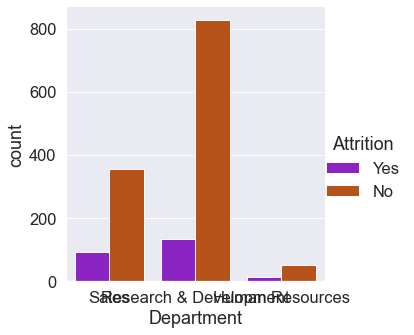

In [135]:
sns.catplot(x='Department', hue='Attrition', palette='gnuplot', kind='count', data=df)
plt.show()

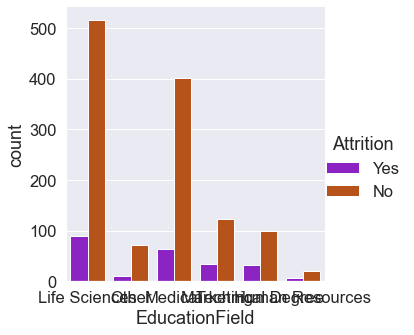

In [136]:
sns.catplot(x='EducationField', hue='Attrition', palette='gnuplot', kind='count', data=df)
plt.show()

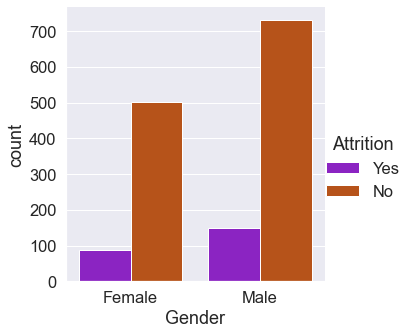

In [137]:
sns.catplot(x='Gender', hue='Attrition', palette='gnuplot', kind='count', data=df)
plt.show()

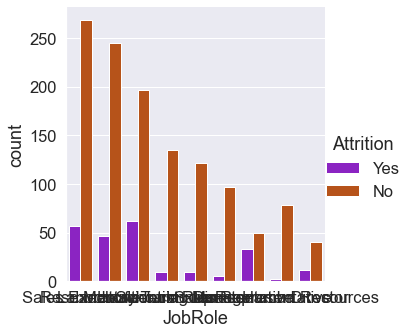

In [138]:
sns.catplot(x='JobRole', hue='Attrition', palette='gnuplot', kind='count', data=df)
plt.show()

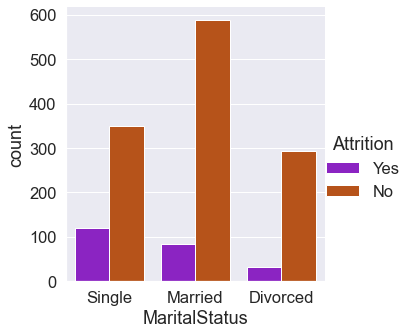

In [139]:
sns.catplot(x='MaritalStatus', hue='Attrition', palette='gnuplot', kind='count', data=df)
plt.show()

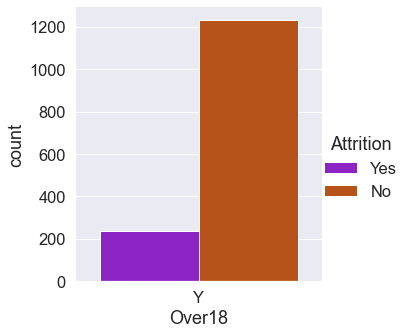

In [140]:
sns.catplot(x='Over18', hue='Attrition', palette='gnuplot', kind='count', data=df)
plt.show()

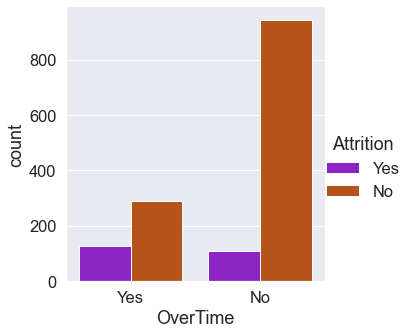

In [141]:
sns.catplot(x='OverTime', hue='Attrition', palette='gnuplot', kind='count', data=df)
plt.show()

# Multivarient Analysis

<Figure size 7200x7200 with 0 Axes>

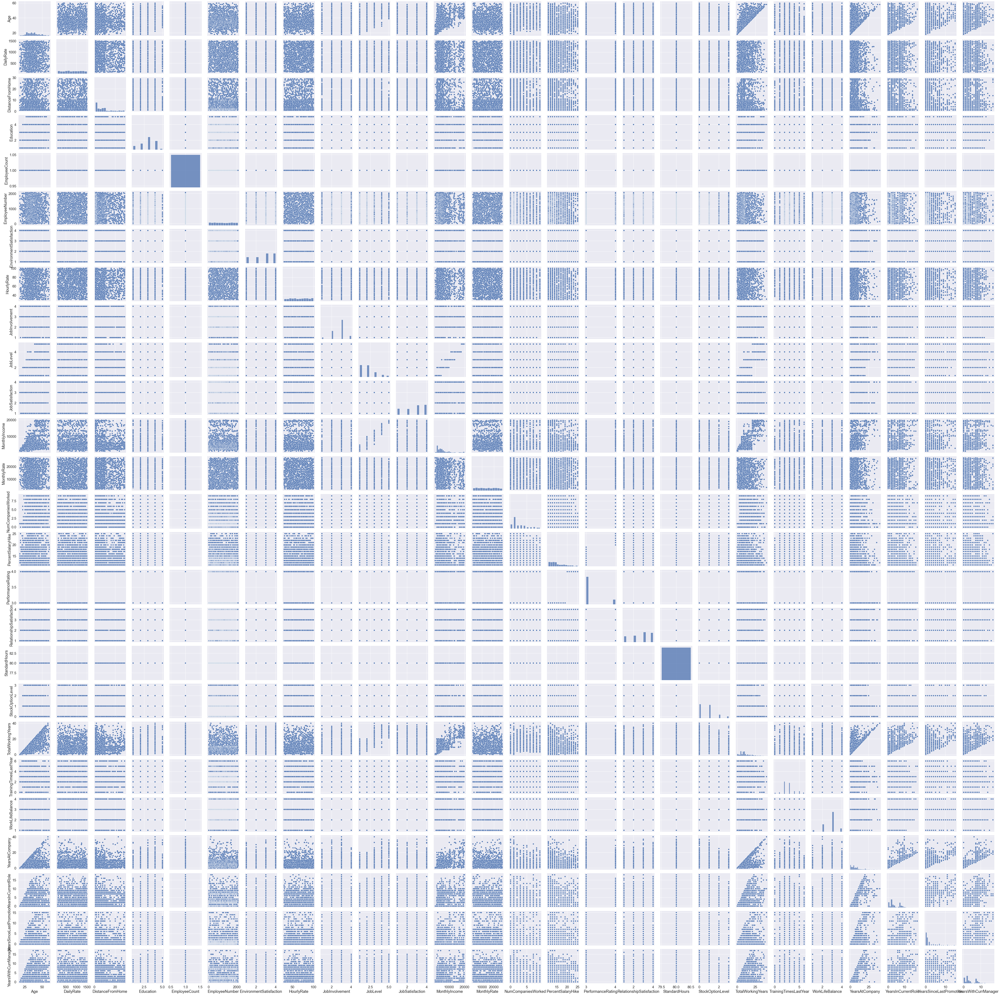

In [142]:
plt.figure(figsize=(100,100))
sns.pairplot(df)
plt.show()

<Figure size 14400x14400 with 0 Axes>

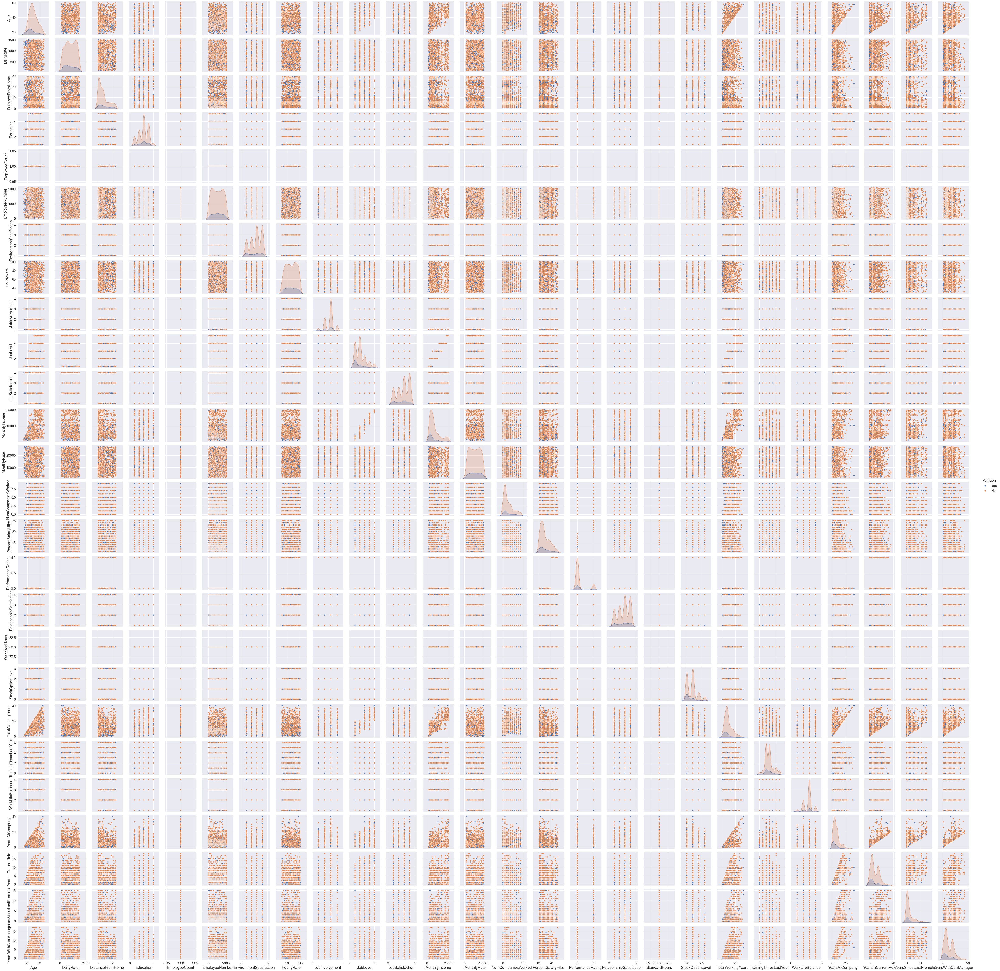

In [143]:
plt.figure(figsize=(200,200))
sns.pairplot(df, hue='Attrition')
plt.show()

# Checking for the outliers

we never check the presence of outliers from categorical columns and label columns

To check the presence of outliers with help of visualization we use boxplot to see if the outliers are present or not 

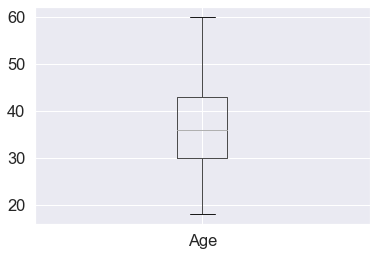

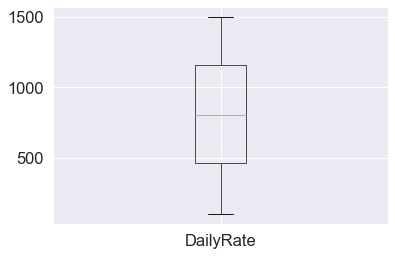

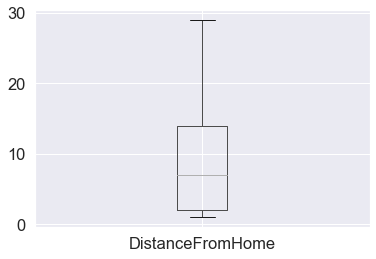

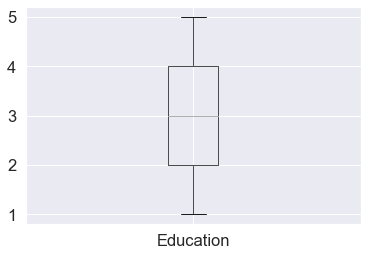

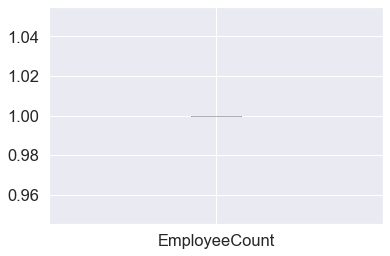

...

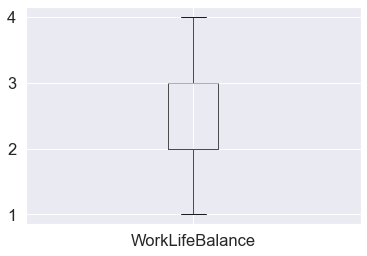

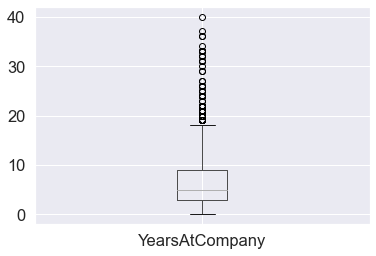

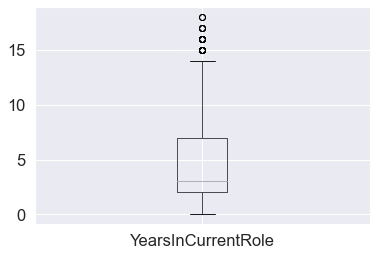

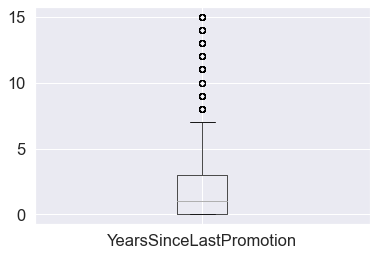

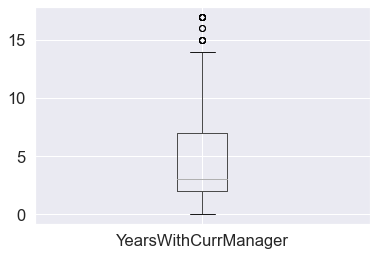

In [144]:
#checking for outliers by visualiztion 
for col in numerical_col:
    df.boxplot(col)
    plt.show()

Here we can say that after boxplot visualization  in columns ['YearsWithCurrManager', 'YearsSinceLastPromotion', 'YearsInCurrentRole', 'YearsAtCompany', 'TrainingTimesLastYear', 'TotalWorkingYears', 'StockOptionLevel', 'PerformanceRating', 'NumCompaniesWorked', 'MonthlyIncome'] has presence of outliers

# Removing outliers

In [145]:
#Removing outliers
from scipy.stats import zscore
col_list=df[['YearsWithCurrManager', 'YearsSinceLastPromotion', 'YearsInCurrentRole', 'YearsAtCompany', 'TrainingTimesLastYear', 'TotalWorkingYears', 'StockOptionLevel', 'PerformanceRating', 'NumCompaniesWorked', 'MonthlyIncome']]
z=np.abs(zscore(col_list))

z

,YearsWithCurrManager,YearsSinceLastPromotion,YearsInCurrentRole,YearsAtCompany,TrainingTimesLastYear,TotalWorkingYears,StockOptionLevel,PerformanceRating,NumCompaniesWorked,MonthlyIncome
0,0.245834,0.679146,0.063296,0.164613,2.171982,0.421642,0.932014,0.426230,2.125136,0.108350
1,0.806541,0.368715,0.764998,0.488508,0.155707,0.164511,0.241988,2.346151,0.678049,0.291719
2,1.155935,0.679146,1.167687,1.144294,0.155707,0.550208,0.932014,0.426230,1.324226,0.937654
3,1.155935,0.252146,0.764998,0.161947,0.155707,0.421642,0.932014,0.426230,0.678049,0.763634
4,0.595227,0.058285,0.615492,0.817734,0.155707,0.678774,0.241988,0.426230,2.525591,0.644858
...,...,...,...,...,...,...,...,...,...,...
1465,0.314873,0.679146,0.615492,0.327893,0.155707,0.735447,0.241988,0.426230,0.523316,0.835451
1466,0.806541,0.368715,0.764998,0.001333,1.707500,0.293077,0.241988,0.426230,0.523316,0.741140
1467,0.314873,0.679146,0.615492,0.164613,2.171982,0.678774,0.241988,2.346151,0.678049,0.076690
1468,1.086895,0.679146,0.488900,0.325228,0.155707,0.735447,0.932014,0.426230,0.277594,0.236474


In [146]:
threshold=3

print(np.where(z>3))

(array([  28,   45,   62,   62,   63,   64,   85,   98,   98,  110,  123,
        123,  123,  126,  126,  126,  153,  178,  187,  187,  190,  190,
        218,  231,  231,  237,  237,  270,  270,  281,  326,  386,  386,
        401,  411,  425,  425,  427,  445,  466,  473,  477,  535,  561,
        561,  584,  592,  595,  595,  595,  616,  624,  635,  653,  653,
        677,  686,  701,  716,  746,  749,  752,  799,  838,  861,  861,
        875,  875,  894,  914,  914,  918,  922,  926,  926,  937,  956,
        962,  976,  976, 1008, 1024, 1043, 1078, 1078, 1086, 1086, 1093,
       1111, 1116, 1116, 1135, 1138, 1138, 1156, 1184, 1221, 1223, 1242,
       1295, 1301, 1301, 1303, 1327, 1331, 1348, 1351, 1401, 1414, 1430],
      dtype=int64), array([0, 1, 1, 3, 2, 1, 5, 3, 5, 1, 0, 1, 2, 1, 3, 5, 0, 1, 0, 5, 2, 3,
       1, 0, 2, 1, 3, 3, 5, 2, 1, 0, 1, 5, 3, 1, 3, 1, 5, 2, 3, 3, 1, 0,
       3, 1, 3, 1, 3, 5, 0, 5, 0, 1, 3, 3, 0, 1, 2, 2, 3, 1, 1, 1, 1, 3,
       0, 1, 5, 1, 3, 3, 1, 0

In [147]:
df_new=df[(z<3).all(axis=1)]

df_new

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [148]:
df_new.shape

(1387, 35)

In [149]:
df.shape

(1470, 35)

In [ ]:
#Checking dataloss
Dataloss = (((30-29)/30)*100)
Dataloss

In [150]:
df=df_new

In [151]:
df.shape

(1387, 35)

# Checking skewness

In [152]:
df.skew()

Age                         0.472280
DailyRate                  -0.017078
DistanceFromHome            0.954752
Education                  -0.289024
EmployeeCount               0.000000
EmployeeNumber              0.018931
EnvironmentSatisfaction    -0.325285
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobSatisfaction            -0.345612
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StandardHours               0.000000
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
YearsAtCompany              1.248623
YearsInCurrentRole          0.726675
YearsSinceLastPromotion     1.756335
YearsWithCurrManager        0.694506
dtype: float64

Accpectable range for skewness is -0.5 to +0.5 so we can say that skewness is present in the dataset and we have to treat the skewness.

We will use square root method to treat the skewness present in the dataset

In [153]:
df['DistanceFromHome']=np.sqrt(df['DistanceFromHome'])
df['JobLevel']=np.sqrt(df['JobLevel'])
df['MonthlyIncome']=np.sqrt(df['MonthlyIncome'])
df['NumCompaniesWorked']=np.sqrt(df['NumCompaniesWorked'])
df['PercentSalaryHike']=np.sqrt(df['PercentSalaryHike'])
df['PerformanceRating']=np.sqrt(df['PerformanceRating'])
df['StockOptionLevel']=np.sqrt(df['StockOptionLevel'])
df['TotalWorkingYears']=np.sqrt(df['TotalWorkingYears'])
df['YearsAtCompany']=np.sqrt(df['YearsAtCompany'])
df['YearsInCurrentRole']=np.sqrt(df['YearsInCurrentRole'])
df['YearsSinceLastPromotion']=np.sqrt(df['YearsSinceLastPromotion'])
df['YearsWithCurrManager']=np.sqrt(df['YearsWithCurrManager'])

To check that the skewness is removed or not we will use histrogram plot to visualize that skewness is still present or not 

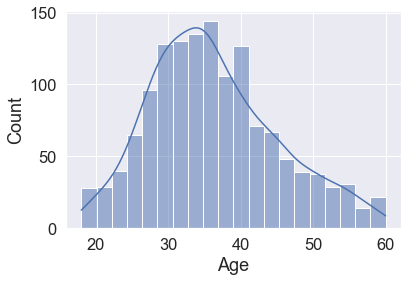

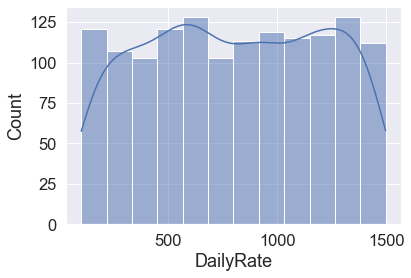

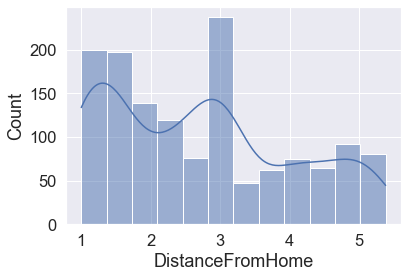

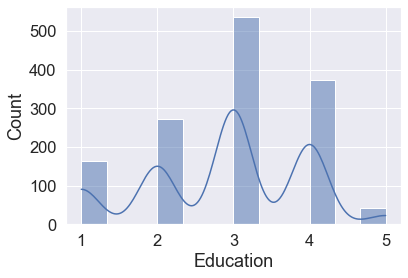

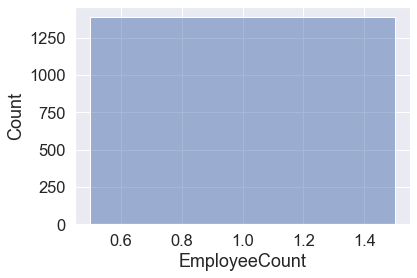

...

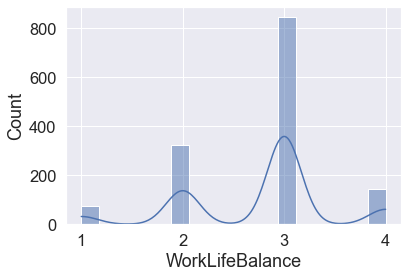

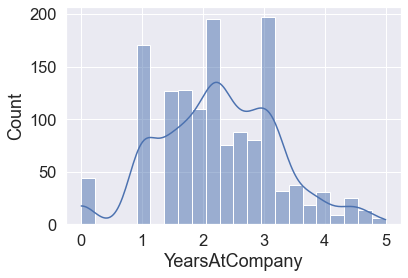

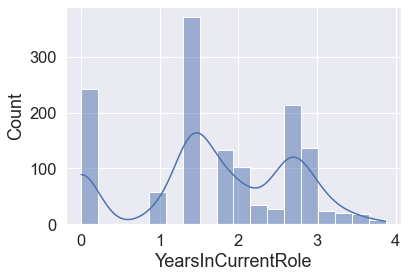

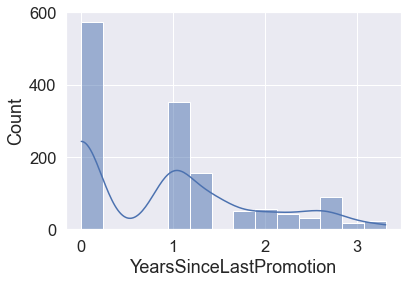

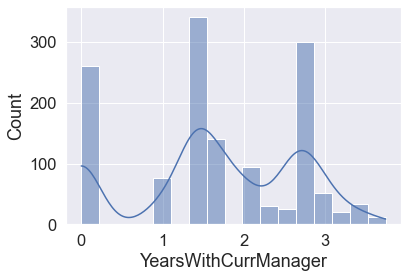

In [154]:
#checking for skewness by visualizing
for i in numerical_col:
    sns.histplot(df[i], kde= True)
    plt.show()

After visualizing with histrogram plot we can say that skewness is removed from the dataset

# Encoding Categorical Columns

Now we convert categorical columns into numerical columns and for this we will use Label Encoder

In [155]:
#Encoding categorical columns using label Encoder

for col in df.select_dtypes(include='object').columns:
    df[col] = pd.Categorical(df[col])
    df[col] = df[col].cat.codes

df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1.000000,2,1,1,1,...,1,80,0.0,2.828427,0,1,2.449490,2.000000,0.000000,2.236068
1,49,0,1,279,1,2.828427,1,1,1,2,...,4,80,1.0,3.162278,3,3,3.162278,2.645751,1.000000,2.645751
2,37,1,2,1373,1,1.414214,2,4,1,4,...,2,80,0.0,2.645751,3,3,0.000000,0.000000,0.000000,0.000000
3,33,0,1,1392,1,1.732051,4,1,1,5,...,3,80,0.0,2.828427,3,3,2.828427,2.645751,1.732051,0.000000
4,27,0,2,591,1,1.414214,1,3,1,7,...,4,80,1.0,2.449490,3,3,1.414214,1.414214,1.414214,1.414214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,4.795832,2,3,1,2061,...,3,80,1.0,4.123106,3,3,2.236068,1.414214,0.000000,1.732051
1466,39,0,2,613,1,2.449490,1,3,1,2062,...,1,80,1.0,3.000000,5,3,2.645751,2.645751,1.000000,2.645751
1467,27,0,2,155,1,2.000000,3,1,1,2064,...,2,80,1.0,2.449490,0,3,2.449490,1.414214,0.000000,1.732051
1468,49,0,1,1023,2,1.414214,3,3,1,2065,...,4,80,0.0,4.123106,3,2,3.000000,2.449490,0.000000,2.828427


In [156]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1387 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1387 non-null   int64  
 1   Attrition                 1387 non-null   int8   
 2   BusinessTravel            1387 non-null   int8   
 3   DailyRate                 1387 non-null   int64  
 4   Department                1387 non-null   int8   
 5   DistanceFromHome          1387 non-null   float64
 6   Education                 1387 non-null   int64  
 7   EducationField            1387 non-null   int8   
 8   EmployeeCount             1387 non-null   int64  
 9   EmployeeNumber            1387 non-null   int64  
 10  EnvironmentSatisfaction   1387 non-null   int64  
 11  Gender                    1387 non-null   int8   
 12  HourlyRate                1387 non-null   int64  
 13  JobInvolvement            1387 non-null   int64  
 14  JobLevel

Here we can see that all the columns which are present in the dataset are in numerical type columns the object type data is converted into int32 type data

In [157]:
# now we see the statistical summary of the dataset  
df.describe()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.0,1387.000000,...,1387.000000,1387.0,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000,1387.000000
mean,36.258111,0.165105,1.604182,806.054074,1.260995,2.723329,2.896179,2.256669,1.0,1026.304254,...,2.703677,80.0,0.657297,3.028105,2.803893,2.762797,2.271738,1.695817,0.938660,1.665216
std,8.838767,0.371409,0.667584,403.163183,0.526032,1.327172,1.023198,1.336205,0.0,602.623780,...,1.081529,0.0,0.603478,1.064655,1.291737,0.705043,0.971817,0.996122,0.946223,1.013945
min,18.000000,0.000000,0.000000,102.000000,0.000000,1.000000,1.000000,0.000000,1.0,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,1.000000,467.500000,1.000000,1.414214,2.000000,1.000000,1.0,489.500000,...,2.000000,80.0,0.000000,2.449490,2.000000,2.000000,1.732051,1.414214,0.000000,1.414214
50%,35.000000,0.000000,2.000000,807.000000,1.000000,2.645751,3.000000,2.000000,1.0,1022.000000,...,3.000000,80.0,1.000000,3.000000,3.000000,3.000000,2.236068,1.732051,1.000000,1.732051
75%,42.000000,0.000000,2.000000,1160.000000,2.000000,3.741657,4.000000,3.000000,1.0,1557.500000,...,4.000000,80.0,1.000000,3.605551,3.000000,3.000000,3.000000,2.645751,1.414214,2.645751
max,60.000000,1.000000,2.000000,1498.000000,2.000000,5.385165,5.000000,5.000000,1.0,2068.000000,...,4.000000,80.0,1.732051,5.830952,6.000000,4.000000,5.000000,3.872983,3.316625,3.741657


we can observe a brief description of the data total number of count for row, mean, std, min., 25%, 50%, 75% percentile, max. values for each columns 

# Correlation between target variable and independent variables

In [158]:
#checking the correlation
cor=df.corr()
cor

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159366,0.022340,0.021946,-0.038242,-0.021908,0.198502,-0.032676,NaN,-0.002704,...,0.041744,NaN,0.079277,0.638104,-0.019008,-0.016913,0.178930,0.115124,0.106362,0.111389
Attrition,-0.159366,1.000000,-0.001041,-0.057220,0.063637,0.082753,-0.032703,0.023585,NaN,-0.010169,...,-0.052344,NaN,-0.175661,-0.218940,-0.057285,-0.062492,-0.197389,-0.190660,-0.045852,-0.195680
BusinessTravel,0.022340,-0.001041,1.000000,-0.004606,-0.003521,-0.023017,-0.010560,0.022576,NaN,-0.013273,...,-0.029660,NaN,-0.012992,0.035194,0.010322,-0.014140,-0.018499,-0.032004,-0.028000,-0.029453
DailyRate,0.021946,-0.057220,-0.004606,1.000000,-0.005398,-0.005770,-0.018442,0.040645,NaN,-0.044886,...,0.004516,NaN,0.048362,0.044551,0.005861,-0.044266,0.004843,0.021948,-0.039903,0.010582
Department,-0.038242,0.063637,-0.003521,-0.005398,1.000000,0.032139,0.012846,0.013432,NaN,-0.007828,...,-0.037705,NaN,-0.002119,-0.009324,0.036092,0.026978,0.023944,0.052590,0.028646,0.021186
DistanceFromHome,-0.021908,0.082753,-0.023017,-0.005770,0.032139,1.000000,0.002868,0.009220,NaN,0.033564,...,0.009331,NaN,0.033895,-0.004255,-0.024032,-0.031222,0.010061,0.017853,0.000941,-0.004113
Education,0.198502,-0.032703,-0.010560,-0.018442,0.012846,0.002868,1.000000,-0.038017,NaN,0.042707,...,-0.002393,NaN,0.026467,0.150043,-0.026879,0.007844,0.037154,0.050806,0.025000,0.025498
EducationField,-0.032676,0.023585,0.022576,0.040645,0.013432,0.009220,-0.038017,1.000000,NaN,0.000058,...,-0.013734,NaN,-0.017443,-0.007788,0.050502,0.034038,-0.001361,0.007746,0.025473,0.028264
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.002704,-0.010169,-0.013273,-0.044886,-0.007828,0.033564,0.042707,0.000058,NaN,1.000000,...,-0.063017,NaN,0.054919,-0.003282,0.018555,0.006280,0.015118,0.006764,0.008122,0.002366


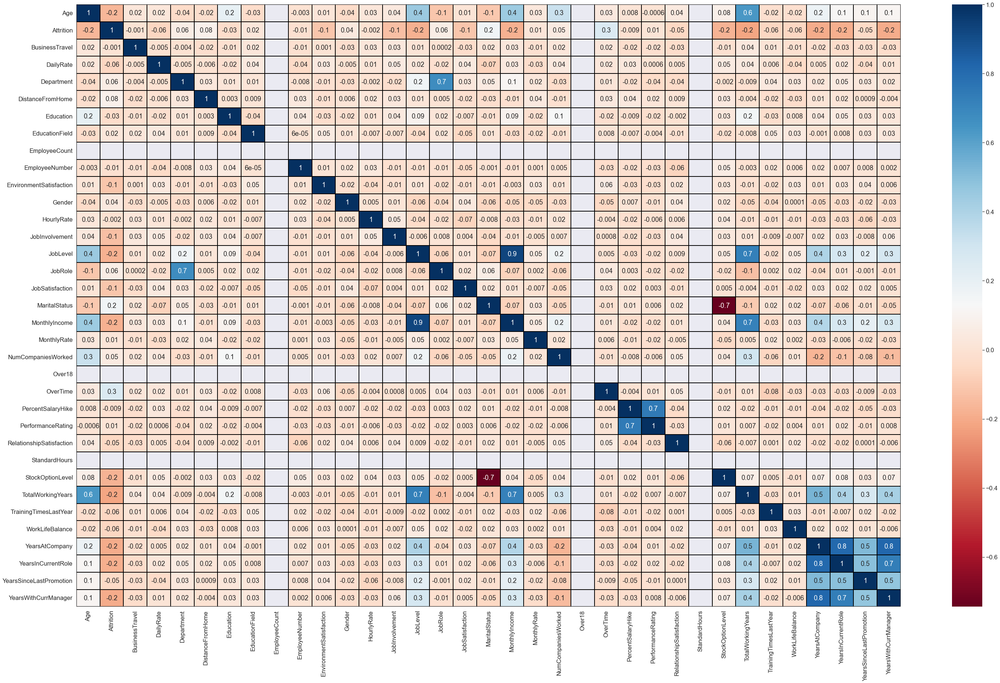

In [159]:
# Increase the font size
sns.set(font_scale=1.5)

# Create a larger figure size
plt.figure(figsize=(50,30))

# Plot the heatmap with adjusted parameters
sns.heatmap(df.corr(), annot=True, fmt='.1g', cmap='RdBu', linewidths=0.1, linecolor='black')

# Display the plot
plt.show()

In [160]:
cor['Attrition'].sort_values(ascending=False)

Attrition                   1.000000
OverTime                    0.257237
MaritalStatus               0.160960
DistanceFromHome            0.082753
JobRole                     0.064283
Department                  0.063637
NumCompaniesWorked          0.052899
Gender                      0.036252
EducationField              0.023585
MonthlyRate                 0.014888
PerformanceRating           0.010781
BusinessTravel             -0.001041
HourlyRate                 -0.001532
PercentSalaryHike          -0.008883
EmployeeNumber             -0.010169
Education                  -0.032703
YearsSinceLastPromotion    -0.045852
RelationshipSatisfaction   -0.052344
DailyRate                  -0.057220
TrainingTimesLastYear      -0.057285
WorkLifeBalance            -0.062492
EnvironmentSatisfaction    -0.112393
JobSatisfaction            -0.114206
JobInvolvement             -0.133957
Age                        -0.159366
StockOptionLevel           -0.175661
MonthlyIncome              -0.180618
J

# Seprating features and label

In [161]:
x=df.drop('Attrition', axis=1)
y=df['Attrition']

In [162]:
x.shape

(1387, 34)

In [163]:
y.shape

(1387,)

In [164]:
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,2,1102,2,1.000000,2,1,1,1,2,...,1,80,0.0,2.828427,0,1,2.449490,2.000000,0.000000,2.236068
1,49,1,279,1,2.828427,1,1,1,2,3,...,4,80,1.0,3.162278,3,3,3.162278,2.645751,1.000000,2.645751
2,37,2,1373,1,1.414214,2,4,1,4,4,...,2,80,0.0,2.645751,3,3,0.000000,0.000000,0.000000,0.000000
3,33,1,1392,1,1.732051,4,1,1,5,4,...,3,80,0.0,2.828427,3,3,2.828427,2.645751,1.732051,0.000000
4,27,2,591,1,1.414214,1,3,1,7,1,...,4,80,1.0,2.449490,3,3,1.414214,1.414214,1.414214,1.414214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,1,884,1,4.795832,2,3,1,2061,3,...,3,80,1.0,4.123106,3,3,2.236068,1.414214,0.000000,1.732051
1466,39,2,613,1,2.449490,1,3,1,2062,4,...,1,80,1.0,3.000000,5,3,2.645751,2.645751,1.000000,2.645751
1467,27,2,155,1,2.000000,3,1,1,2064,2,...,2,80,1.0,2.449490,0,3,2.449490,1.414214,0.000000,1.732051
1468,49,1,1023,2,1.414214,3,3,1,2065,4,...,4,80,0.0,4.123106,3,2,3.000000,2.449490,0.000000,2.828427


In [165]:
y

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1387, dtype: int8

# Feature Scalling Using Standard Scalarization

In [166]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.536681,0.593126,0.734325,1.405373,-1.298965,-0.876177,-0.940815,0.0,-1.702014,-0.665328,...,-1.575817,0.0,-1.089574,-0.187619,-2.171420,-2.501172,0.182972,0.305477,-0.992366,0.563204
1,1.442111,-0.905354,-1.307769,-0.496337,0.079218,-1.853858,-0.940815,0.0,-1.700354,0.251978,...,1.199034,0.0,0.568085,0.126070,0.151871,0.336558,0.916696,0.953976,0.064849,0.967398
2,0.083966,0.593126,1.406752,-0.496337,-0.986750,-0.876177,1.305159,0.0,-1.697034,1.169285,...,-0.650866,0.0,-1.089574,-0.359263,0.151871,0.336558,-2.338461,-1.703033,-0.992366,-1.642907
3,-0.368749,-0.905354,1.453896,-0.496337,-0.747180,1.079185,-0.940815,0.0,-1.695374,1.169285,...,0.274084,0.0,-1.089574,-0.187619,0.151871,0.336558,0.573040,0.953976,0.838784,-1.642907
4,-1.047821,0.593126,-0.533609,-0.496337,-0.986750,-1.853858,0.556501,0.0,-1.692054,-1.582635,...,1.199034,0.0,0.568085,-0.543673,0.151871,0.336558,-0.882711,-0.282802,0.502762,-0.247640
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,-0.029213,-0.905354,0.193406,-0.496337,1.562155,-0.876177,0.556501,0.0,1.717604,0.251978,...,0.274084,0.0,0.568085,1.028874,0.151871,0.336558,-0.036718,-0.282802,-0.992366,0.065939
1383,0.310324,0.593126,-0.479021,-0.496337,-0.206408,-1.853858,0.556501,0.0,1.719264,1.169285,...,-1.575817,0.0,0.568085,-0.026408,1.700732,0.336558,0.384998,0.953976,0.064849,0.967398
1384,-1.047821,0.593126,-1.615447,-0.496337,-0.545212,0.101504,-0.940815,0.0,1.722584,-0.665328,...,-0.650866,0.0,0.568085,-0.543673,-2.171420,0.336558,0.182972,-0.282802,-0.992366,0.065939
1385,1.442111,-0.905354,0.538304,1.405373,-0.986750,0.101504,0.556501,0.0,1.724244,1.169285,...,1.199034,0.0,-1.089574,1.028874,0.151871,-1.082307,0.749652,0.756880,-0.992366,1.147627


We have scaled the data using standard scalarization method to overcome the issue of biasness we have use standard scaler which will convert dataset into  mean=0 and std=1

Now we check for the multicolinearity for this we use Variance Inflation factor(VIF) method

# Checking for multicolinearity

In [167]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

# Create an empty DataFrame to store the VIF values
vif_values = []
features = []

for i in range(len(x.columns)):
    vif = variance_inflation_factor(x.values, i)
    vif_values.append(vif)
    features.append(x.columns[i])

# Create a new DataFrame to display the VIF values and features
vif_df = pd.DataFrame({'Features': features, 'VIF Values': vif_values})

vif_df

,Features,VIF Values
0,Age,1.878799
1,BusinessTravel,1.015491
2,DailyRate,1.029123
3,Department,2.081320
4,DistanceFromHome,1.019390
5,Education,1.061015
6,EducationField,1.020922
7,EmployeeCount,NaN
8,EmployeeNumber,1.022278
9,EnvironmentSatisfaction,1.023668


If vif value is greater than 10 than we can say that multicolinearity is present there but here vif values in all the columns are less than 10 so we can say that multicolinearity is not present in the dataset 

# Oversampling method for balancing of the data set

In [168]:
#Checking value count of target column
y.value_counts()

0    1158
1     229
Name: Attrition, dtype: int64

In [169]:
#oversampling the data
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x,y=sm.fit_resample(x,y)

In [170]:
#Checking value count of target column
y.value_counts()

1    1158
0    1158
Name: Attrition, dtype: int64

Here we can see that both 0 & 1 has equal number of values we use this to prevent the biaseness in the dataset

# Modeling

Since the outcome has only two variable we will use binary clasification model

In [171]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score

# Finding best random state

In [172]:
# Initialize a random state variable
random_state = None

for i in range(0, 1000):
    x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=i, test_size=0.20)
    
    # Fit the logistic regression model
    lr = LogisticRegression()
    lr.fit(x_train, y_train)
    
    # Make predictions on train and test sets
    pred_train = lr.predict(x_train)
    pred_test = lr.predict(x_test)
    
    # Evaluate the model's accuracy
    train_accuracy = round(accuracy_score(y_train, pred_train) * 100, 1)
    test_accuracy = round(accuracy_score(y_test, pred_test) * 100, 1)
    
    # Check if the training accuracy is equal to the testing accuracy
    if train_accuracy == test_accuracy:
        random_state = i
        break

if random_state is not None:
    print('At random state', random_state, 'The model performs very well')
    print('At random state:', random_state)
    print("Training accuracy is:", train_accuracy)
    print("Testing accuracy is:", test_accuracy)
else:
    print("No random state found where the model performs equally well on both train and test sets")

At random state 31 The model performs very well
At random state: 31
Training accuracy is: 80.2
Testing accuracy is: 80.2


In [173]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=31)

In [179]:
from sklearn.metrics import classification_report
print(accuracy_score(y_test,pred_test))
print(classification_report(y_test,pred_test))
print(confusion_matrix(y_test,pred_test))

0.8017241379310345
              precision    recall  f1-score   support

           0       0.79      0.82      0.80       229
           1       0.81      0.79      0.80       235

    accuracy                           0.80       464
   macro avg       0.80      0.80      0.80       464
weighted avg       0.80      0.80      0.80       464

[[187  42]
 [ 50 185]]


# cross validation score for logistic regression

In [176]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score

# Predict using logistic regression
pred_lr = lr.predict(x_test)

# Calculate the accuracy score
lss = accuracy_score(y_test, pred_lr)

# Perform cross-validation for different folds
for j in range(2, 15):
    # Calculate cross-validation scores
    cv_scores = cross_val_score(lr, x, y, cv=j)
    mean_cv_score = cv_scores.mean()
    
    # Display the results
    print('At cv:', j)
    print('Cross-validation score is:', mean_cv_score * 100)
    print('Accuracy score is:', lss * 100)
    print('\n')

At cv: 2
Cross-validation score is: 56.347150259067355
Accuracy score is: 80.17241379310344


At cv: 3
Cross-validation score is: 69.73229706390327
Accuracy score is: 80.17241379310344


At cv: 4
Cross-validation score is: 74.26597582037996
Accuracy score is: 80.17241379310344


At cv: 5
Cross-validation score is: 76.25381693602442
Accuracy score is: 80.17241379310344


At cv: 6
Cross-validation score is: 76.94300518134716
Accuracy score is: 80.17241379310344


At cv: 7
Cross-validation score is: 77.80541714076458
Accuracy score is: 80.17241379310344


At cv: 8
Cross-validation score is: 78.06422264646223
Accuracy score is: 80.17241379310344


At cv: 9
Cross-validation score is: 78.28250837028324
Accuracy score is: 80.17241379310344


At cv: 10
Cross-validation score is: 78.27978056426332
Accuracy score is: 80.17241379310344


At cv: 11
Cross-validation score is: 78.40811637020167
Accuracy score is: 80.17241379310344


At cv: 12
Cross-validation score is: 78.49740932642487
Accuracy sco

In [180]:
lsscore_selected=cross_val_score(lr,x,y,cv=13).mean()
print('The cv Score is:', lsscore_selected, '\n The accuracy score is:', lss)

The cv Score is: 0.7884386030139593 
 The accuracy score is: 0.8017241379310345


In [189]:
print('Difference between Accuracy score and cross validation score is -',lss - lsscore_selected)

Difference between Accuracy score and cross validation score is - 0.013285534917075181


# Importing various classification libraries

In [198]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.linear_model import Lasso,Ridge

# DecisionTree Classifier

In [183]:
#checking accuracy for DecisionTreeclassifier
DTC=DecisionTreeClassifier()
DTC.fit(x_train, y_train)
predDTC=DTC.predict(x_test)
print('Accuracy Score',accuracy_score(y_test, predDTC))
print('Confusion Matrix',confusion_matrix(y_test, predDTC))
print('Classification Report',classification_report(y_test,predDTC))

Accuracy Score 0.8663793103448276
Confusion Matrix [[204  25]
 [ 37 198]]
Classification Report               precision    recall  f1-score   support

           0       0.85      0.89      0.87       229
           1       0.89      0.84      0.86       235

    accuracy                           0.87       464
   macro avg       0.87      0.87      0.87       464
weighted avg       0.87      0.87      0.87       464



Cross validation score DTC

In [184]:
#using k-fold cross validation for decision tree classifier 
cvscore=cross_val_score(DTC,x,y)
print(cvscore)
print(cvscore.mean())
print('Difference between Accuracy score and cross validation score is -',accuracy_score(y_test,predDTC) - cvscore.mean())

[0.63577586 0.87041037 0.89200864 0.63930886 0.54427646]
0.7163560363446786
Difference between Accuracy score and cross validation score is - 0.15002327400014903


# Support Vector Classifier

In [185]:
#checking accuracy for support vector machine classifier

svc=SVC()
svc.fit(x_train,y_train)
predsvc= svc.predict(x_test)
print('Accuracy Score', accuracy_score(y_test,predsvc))
print('Confusion Matrix', confusion_matrix(y_test,predsvc))
print('Classification Report', classification_report(y_test,predsvc))

Accuracy Score 0.9353448275862069
Confusion Matrix [[211  18]
 [ 12 223]]
Classification Report               precision    recall  f1-score   support

           0       0.95      0.92      0.93       229
           1       0.93      0.95      0.94       235

    accuracy                           0.94       464
   macro avg       0.94      0.94      0.94       464
weighted avg       0.94      0.94      0.94       464



cross validation score for SVC

In [187]:
#using k-fold cross validation for support vector classifier
cvscore=cross_val_score(svc,x,y)
print(cvscore)
print(cvscore.mean())
print('Difference between Accuracy score and cross validation score is -',accuracy_score(y_test,predsvc) - cvscore.mean())

[0.88577586 0.93304536 0.93520518 0.90928726 0.89848812]
0.9123603559991063
Difference between Accuracy score and cross validation score is - 0.022984471587100597


# K-Neighbors Classifier

In [190]:
#checking accuracy for support k-Neighbors classifier

KNN=KNeighborsClassifier()
KNN.fit(x_train,y_train)
predKNN= KNN.predict(x_test)
print('Accuracy Score', accuracy_score(y_test,predKNN))
print('Confusion Matrix', confusion_matrix(y_test,predKNN))
print('Classification Report', classification_report(y_test,predKNN))

Accuracy Score 0.8060344827586207
Confusion Matrix [[144  85]
 [  5 230]]
Classification Report               precision    recall  f1-score   support

           0       0.97      0.63      0.76       229
           1       0.73      0.98      0.84       235

    accuracy                           0.81       464
   macro avg       0.85      0.80      0.80       464
weighted avg       0.85      0.81      0.80       464



cross validation scor for KNN

In [191]:
#Using k-fold cross validation for K-Neighbour Classifier

cvscore=cross_val_score(KNN,x,y)
print(cvscore)
print(cvscore.mean())
print('Difference between Accuracy score and cross validation score is -',accuracy_score(y_test,predKNN) - cvscore.mean())

[0.74784483 0.78617711 0.79049676 0.77105832 0.75809935]
0.7707352722127058
Difference between Accuracy score and cross validation score is - 0.035299210545914894


# Random Forest Classifier

In [182]:
RFC=RandomForestClassifier()
RFC.fit(x_train, y_train)
predRFC=RFC.predict(x_test)
print(accuracy_score(y_test, predRFC))
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test,predRFC))

0.9482758620689655
[[224   5]
 [ 19 216]]
              precision    recall  f1-score   support

           0       0.92      0.98      0.95       229
           1       0.98      0.92      0.95       235

    accuracy                           0.95       464
   macro avg       0.95      0.95      0.95       464
weighted avg       0.95      0.95      0.95       464



cross validation score for RFC

In [192]:
#Using k-fold cross validation for Random Forest Classifier

cvscore=cross_val_score(RFC,x,y)
print(cvscore)
print(cvscore.mean())
print('Difference between Accuracy score and cross validation score is -',accuracy_score(y_test,predRFC) - cvscore.mean())

[0.79094828 0.9762419  0.96976242 0.9524838  0.67386609]
0.8726604975050272
Difference between Accuracy score and cross validation score is - 0.07561536456393836


# Gradient Boosting Classifier

In [195]:
#checking accuracy for gradient boosting classifier
GB=GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB=GB.predict(x_test)
print('Accuracy Score', accuracy_score(y_test,predGB))
print('Confusion Matrix', confusion_matrix(y_test,predGB))
print('Classification Report', classification_report(y_test,predGB))

Accuracy Score 0.9331896551724138
Confusion Matrix [[221   8]
 [ 23 212]]
Classification Report               precision    recall  f1-score   support

           0       0.91      0.97      0.93       229
           1       0.96      0.90      0.93       235

    accuracy                           0.93       464
   macro avg       0.93      0.93      0.93       464
weighted avg       0.94      0.93      0.93       464



cross validation for GB

In [196]:
#using k-fold cross validation for gradient boosting classifier
cvscore=cross_val_score(GB,x,y)
print(cvscore)
print(cvscore.mean())
print('Difference between Accuracy score and cross validation score is -',accuracy_score(y_test,predGB) - cvscore.mean())

[0.59698276 0.89416847 0.85097192 0.87041037 0.52267819]
0.747042340061071
Difference between Accuracy score and cross validation score is - 0.18614731511134286


# ExtraTreeClassifier

In [199]:
#checking accuracy for ExtraTreeClassifier

ET=ExtraTreesClassifier()
ET.fit(x_train,y_train)
predET=ET.predict(x_test)
print('Accuracy Score', accuracy_score(y_test,predET))
print('Confusion Matrix', confusion_matrix(y_test,predET))
print('Classification Report', classification_report(y_test,predET))

Accuracy Score 0.9633620689655172
Confusion Matrix [[220   9]
 [  8 227]]
Classification Report               precision    recall  f1-score   support

           0       0.96      0.96      0.96       229
           1       0.96      0.97      0.96       235

    accuracy                           0.96       464
   macro avg       0.96      0.96      0.96       464
weighted avg       0.96      0.96      0.96       464



cross validation score for ET

In [200]:
#using k-fold cross validation for ExtraTrees classifier
cvscore=cross_val_score(ET,x,y)
print(cvscore)
print(cvscore.mean())
print('Difference between Accuracy score and cross validation score is -',accuracy_score(y_test,predET) - cvscore.mean())

[0.92241379 0.97192225 0.97408207 0.96328294 0.9762419 ]
0.961588590154167
Difference between Accuracy score and cross validation score is - 0.0017734788113502598


# AdaBoost Classifier

In [201]:
#checking accuracy for AdaBoost Classifier
ABC=AdaBoostClassifier()
ABC.fit(x_train, y_train)
predABC=ABC.predict(x_test)
print('Accuracy Score', accuracy_score(y_test,predABC))
print('Confusion Matrix', confusion_matrix(y_test,predABC))
print('Classification Report', classification_report(y_test,predABC))

Accuracy Score 0.9030172413793104
Confusion Matrix [[208  21]
 [ 24 211]]
Classification Report               precision    recall  f1-score   support

           0       0.90      0.91      0.90       229
           1       0.91      0.90      0.90       235

    accuracy                           0.90       464
   macro avg       0.90      0.90      0.90       464
weighted avg       0.90      0.90      0.90       464



cross validation for ABC

In [202]:
#using k-fold cross validation for Adaboosting classifier
cvscore=cross_val_score(ABC,x,y)
print(cvscore)
print(cvscore.mean())
print('Difference between Accuracy score and cross validation score is -',accuracy_score(y_test,predABC) - cvscore.mean())

[0.2112069  0.86825054 0.79697624 0.88984881 0.49028078]
0.651312653608401
Difference between Accuracy score and cross validation score is - 0.2517045877709094


# Bagging Classifier

In [203]:
#checking accuracy for Bagging classifier

BC=BaggingClassifier()
BC.fit(x_train,y_train)
predBC= BC.predict(x_test)
print('Accuracy Score', accuracy_score(y_test,predBC))
print('Confusion Matrix', confusion_matrix(y_test,predBC))
print('Classification Report', classification_report(y_test,predBC))

Accuracy Score 0.8857758620689655
Confusion Matrix [[215  14]
 [ 39 196]]
Classification Report               precision    recall  f1-score   support

           0       0.85      0.94      0.89       229
           1       0.93      0.83      0.88       235

    accuracy                           0.89       464
   macro avg       0.89      0.89      0.89       464
weighted avg       0.89      0.89      0.89       464



cross validation for BC

In [204]:
#using k-fold cross validation for Bagging classifier
cvscore=cross_val_score(BC,x,y)
print(cvscore)
print(cvscore.mean())
print('Difference between Accuracy score and cross validation score is -',accuracy_score(y_test,predBC) - cvscore.mean())

[0.65948276 0.96328294 0.94168467 0.92224622 0.55939525]
0.8092183659789974
Difference between Accuracy score and cross validation score is - 0.07655749608996809


# Selection of the final model 

After trying different different classification model here we reach at the conclusion that ExtraTreesClassifier is our final moel because when we have applied the extra tree classifier we got an accuracy of 96.33% and to over come overfitting and underfitting issue we use cross validation and get cross validation score of 96.15% and we find Difference between Accuracy score and cross validation score that is equal to  0.0017734788113502598. so we select that  model as our final model which has higher accuracy score and higher cross validation score and has lowset difference between between accuracy score and cross validation score. here ExtraTreesClassifier fullfills all our requriment so we select ExtraTreesClassifier as our final model.

# Select ExtraTreesClassifier as our final model

# Perfrom Hyper parameter Tuning 

In [205]:
from sklearn.model_selection import GridSearchCV

parameters={'criterion': ['gini','entropy'],
            'random_state': [10,50,1000],
            'max_depth': [0,10,20],
            'n_jobs': [-2,-1,1],
            'n_estimators': [50,100,200,300]}

In [206]:
GCV=GridSearchCV(ExtraTreesClassifier(),parameters, cv=5)

In [207]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [208]:
GCV.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'n_estimators': 300,
 'n_jobs': -2,
 'random_state': 1000}

# Final Model

For final model we select the best parameters we get from GCV.best_params_ and then applied those paramter to build our final model and check the accuracy of our final model 

In [209]:
# Define and train the Extra Trees Classifier
final_model = ExtraTreesClassifier(criterion='entropy', max_depth=20, n_jobs=-2, n_estimators=300, random_state=1000)
final_model.fit(x_train, y_train)

# Make predictions
pred = final_model.predict(x_test)

# Calculate and print the accuracy score
accuracy = accuracy_score(y_test, pred)
print('Accuracy:', accuracy * 100)

Accuracy: 97.19827586206897


# plotting ROC and compare AUC for all the models used

In [210]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

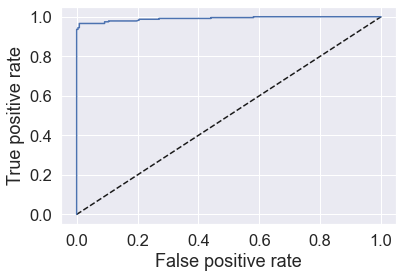

Auc score:
 0.9720616928365697


In [219]:
y_pred_prob=final_model.predict_proba(x_test)[:,1]
fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)
roc_auc=auc(fpr,tpr)

plt.plot([0,1],[0,1], 'k--')
plt.plot(fpr,tpr)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.show()
auc_score=roc_auc_score(y_test, final_model.predict(x_test))
print('Auc score:' '\n', auc_score)

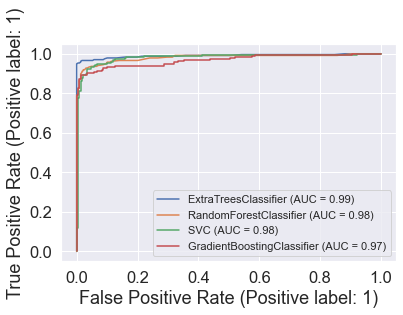

In [212]:
from sklearn.metrics import plot_roc_curve
disp=plot_roc_curve(ET, x_test,y_test)  #ax=Axes with confusion matrix
plot_roc_curve(RFC, x_test, y_test, ax=disp.ax_)

plot_roc_curve(svc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(GB, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc= 'lower right')

plt.show()

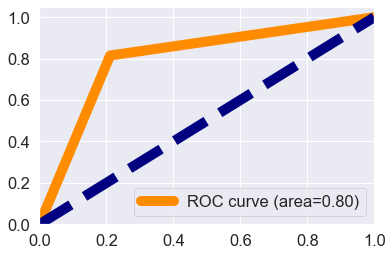

In [213]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds= roc_curve(pred_test, y_test)
roc_auc=auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange', lw=10, label= 'ROC curve (area=%0.2f)' %roc_auc)
plt.plot([0,1], [0,1], color='navy', lw=10, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.legend(loc='lower right')
plt.show()

# Saving final model 

In [217]:
#saving the model
import joblib
joblib.dump(final_model, "hr_attration.pkl")

['hr_attration.pkl']

# predicting attration rate by providing random input

In [222]:
#Load the model
model=joblib.load('hr_attration.pkl')


#prediction
input_data=(41,2,1102,2,1.000000,2,1,1,1,2,2,1,94,3,2,0,4,0,5993,19479,8,0,0,11,1,80,0.0,2.828427,0,1,2.449490,2.000000,0.000000,2.236068)


#change the input data into numpy array
array=np.asarray(input_data)


#reshape the data as we are predicting the label for only one instance
array_reshape=array.reshape(1,-1)

prediction=model.predict(array_reshape)


print(prediction)


if (prediction[0]==0):
    print('No')
    
else:
    print('Yes')

[0]
No


# Conclusion and findings 

After evaluation the dataset we reach to the conclusion that 

OverTime                    
MaritalStatus               
DistanceFromHome            
JobRole                     
Department                  
NumCompaniesWorked


This are the factors that are affecting the attration rate 